# Baseline Experiments — MLLM-Grounded Multi-Region Style Transfer

- Baseline A (IP-Adapter + SDXL) - reference-image style with mask → shows style leakage
- Baseline B (InstructPix2Pix) - text-only editing, no region control → shows grounding failure
- Leakage sweep: how boundary LPIPS changes with style strength
- Full metric suite: CLIP, DINO, boundary-band LPIPS, masked-unmasked gap

In [1]:
# diffusers 0.27.2 is the last version before the IP-Adapter interface changed
!pip install diffusers==0.27.2 transformers accelerate omegaconf lpips open-clip-torch -q
!pip install git+https://github.com/tencent-ailab/IP-Adapter.git -q
print('Dependencies installed')


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 33.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 39.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
Dependencies installed


In [2]:
import os, sys
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from PIL import Image

os.makedirs('/content/outputs', exist_ok=True)


def load_image(path, size=(512, 512)):
    return Image.open(path).convert('RGB').resize(size, Image.LANCZOS)


def save_image(img, path):
    img.save(path)
    print(f'Saved -> {path}')


def show_grid(images, titles, figsize=(16, 5)):
    fig, axes = plt.subplots(1, len(images), figsize=figsize)
    if len(images) == 1:
        axes = [axes]
    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img if isinstance(img, np.ndarray) else np.array(img))
        ax.set_title(title, fontsize=11)
        ax.axis('off')
    plt.tight_layout()
    plt.show()


def make_rect_mask(h, w, region):
    # region = (x1, y1, x2, y2)
    mask = np.zeros((h, w), dtype=np.uint8)
    x1, y1, x2, y2 = region
    mask[y1:y2, x1:x2] = 255
    return mask
def overlay_mask(image, mask, color=(255, 0, 0), alpha=0.4):
    result = np.array(image.convert('RGB')).copy().astype(float)
    overlay = np.zeros_like(result)
    overlay[mask > 127] = color
    return Image.fromarray((result * (1 - alpha) + overlay * alpha).astype(np.uint8))
def make_boundary_band(mask, band_px=15):
    # narrow ring around the mask edge — used for the leakage metric
    k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (band_px*2+1, band_px*2+1))
    return cv2.subtract(cv2.dilate(mask, k), cv2.erode(mask, k))

CFG = {
    'sdxl_inpainting':'diffusers/stable-diffusion-xl-1.0-inpainting-0.1',
    'instruct_pix2pix':'timbrooks/instruct-pix2pix',
    'ip_adapter_repo':'h94/IP-Adapter',
    'seed':42,
    'steps':30,
    'guidance_scale':7.5,
    'image_guidance_scale': 1.5,
    'ip_adapter_scale':0.6,
    'size':(512, 512),
    'band_px':15,
}

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Helpers ready | Device: {DEVICE}')


Helpers ready | Device: cuda


In [3]:
# redefine the two most commonly needed helpers in case of kernel restart
def load_image(path, size=(512, 512)):
    return Image.open(path).convert('RGB').resize(size, Image.LANCZOS)


def show_grid(images, titles, figsize=(16, 5)):
    fig, axes = plt.subplots(1, len(images), figsize=figsize)
    if len(images) == 1:
        axes = [axes]
    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img if isinstance(img, np.ndarray) else np.array(img))
        ax.set_title(title, fontsize=11)
        ax.axis('off')
    plt.tight_layout()
    plt.show()


  HTTP 200 | content-type: image/jpeg | 44985 bytes
  Saved /content/assets/content.jpg (640, 427)
  HTTP 200 | content-type: image/jpeg | 77378 bytes
  Saved /content/assets/style_vangogh.jpg (470, 391)
  HTTP 200 | content-type: image/jpeg | 376101 bytes
  Saved /content/assets/style_monet.jpg (1024, 1024)


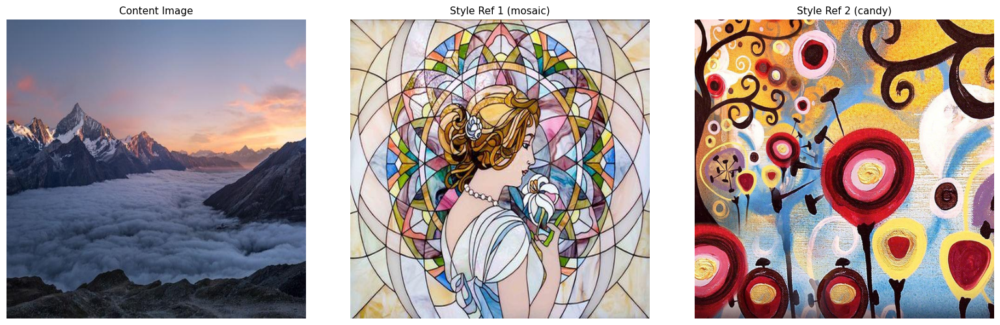

In [16]:
# Download the content image and two reference style images,
# then resize and load them for the regional style transfer experiments.
import requests
import os
from io import BytesIO
from PIL import Image as PILImage

os.makedirs('/content/assets', exist_ok=True)


def download_image(url, path):
    headers = {
        'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36',
        'Referer': 'https://www.google.com/'
    }
    r = requests.get(url, headers=headers, timeout=20)
    print(f'  HTTP {r.status_code} | content-type: {r.headers.get("content-type", "?")} | {len(r.content)} bytes')
    img = PILImage.open(BytesIO(r.content)).convert('RGB')
    img.save(path)
    print(f'  Saved {path} {img.size}')
    return img


print('Downloading content...')
download_image(
    'https://images.unsplash.com/photo-1506905925346-21bda4d32df4?w=640&q=80',
    '/content/assets/content.jpg'
)

print('Downloading Van Gogh style...')
download_image(
    'https://raw.githubusercontent.com/pytorch/examples/main/fast_neural_style/images/style-images/mosaic.jpg',
    '/content/assets/style_vangogh.jpg'
)

print('Downloading Monet style...')
download_image(
    'https://raw.githubusercontent.com/pytorch/examples/main/fast_neural_style/images/style-images/candy.jpg',
    '/content/assets/style_monet.jpg'
)

content  = load_image('/content/assets/content.jpg',CFG['size'])
style_vg = load_image('/content/assets/style_vangogh.jpg', CFG['size'])
style_mn = load_image('/content/assets/style_monet.jpg',CFG['size'])

show_grid(
    [content, style_vg, style_mn],
    ['Content Image', 'Style Ref 1 (mosaic)', 'Style Ref 2 (candy)'])


/content/assets/content.jpg (640, 427)
/content/assets/style_vangogh.jpg (470, 391)
/content/assets/style_monet.jpg (1024, 1024)


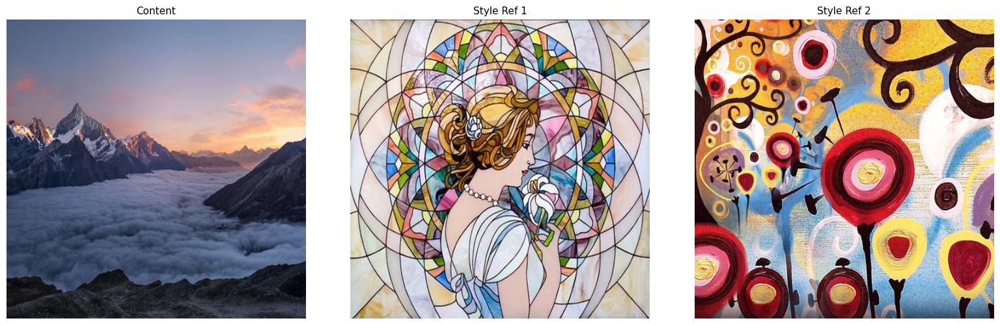

Images ready


In [5]:
import requests
from io import BytesIO

os.makedirs('/content/assets', exist_ok=True)


def download_image(url, path):
    r = requests.get(url, headers={'User-Agent': 'Mozilla/5.0'}, timeout=20)
    img = Image.open(BytesIO(r.content)).convert('RGB')
    img.save(path)
    print(f'{path} {img.size}')


download_image('https://images.unsplash.com/photo-1506905925346-21bda4d32df4?w=640&q=80',
               '/content/assets/content.jpg')
download_image('https://raw.githubusercontent.com/pytorch/examples/main/fast_neural_style/images/style-images/mosaic.jpg',
               '/content/assets/style_vangogh.jpg')
download_image('https://raw.githubusercontent.com/pytorch/examples/main/fast_neural_style/images/style-images/candy.jpg',
               '/content/assets/style_monet.jpg')

content  = load_image('/content/assets/content.jpg',       CFG['size'])
style_vg = load_image('/content/assets/style_vangogh.jpg', CFG['size'])
style_mn = load_image('/content/assets/style_monet.jpg',   CFG['size'])

show_grid([content, style_vg, style_mn], ['Content', 'Style Ref 1', 'Style Ref 2'])
print('Images ready')


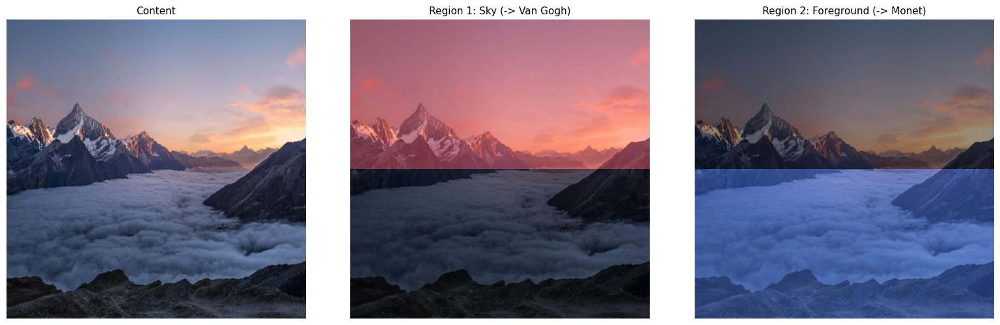

Masks created


In [6]:
H, W = CFG['size'][1], CFG['size'][0]

# simple rectangular masks as starting point — replaced by SAM masks in Phase 3
mask_sky  = make_rect_mask(H, W, region=(0,    0, W, H//2))  # top half -> Van Gogh
mask_fore = make_rect_mask(H, W, region=(0, H//2, W, H))     # bottom half -> Monet

Image.fromarray(mask_sky).save('/content/assets/mask_sky.png')
Image.fromarray(mask_fore).save('/content/assets/mask_fore.png')

show_grid(
    [content,
     overlay_mask(content, mask_sky,  color=(255,  80,  80)),
     overlay_mask(content, mask_fore, color=( 80, 130, 255))],
    ['Content', 'Region 1: Sky (-> Van Gogh)', 'Region 2: Foreground (-> Monet)']
)
print('Masks created')


In [7]:
# older pinned versions needed for IP-Adapter compatibility
!pip install -q "diffusers==0.21.4" "huggingface_hub==0.23.4" transformers accelerate omegaconf lpips open-clip-torch
print('Done — now Runtime -> Restart and run all')


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.1/40.1 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.1/40.1 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.0/42.0 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.0/42.0 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.0/42.0 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

Loading InstructPix2Pix (SD 1.5 based — fast on T4)...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Instruction: "make the sky look like Van Gogh's Starry Night painting, keep the foreground unchanged"


  0%|          | 0/30 [00:00<?, ?it/s]

Saved -> /content/outputs/baseline_b.png


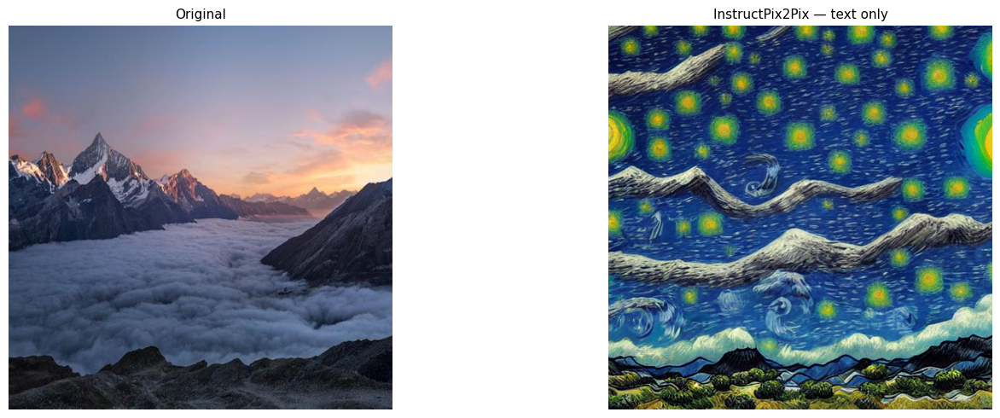


Inspect: did the edit stay in the sky only, or bleed into the foreground?
This is the grounding failure my project addresses.


In [17]:
# Baseline B: text-only editing with no region mask
# used to show that instruction-based methods can't isolate edits spatially
from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler

print('Loading InstructPix2Pix (SD 1.5 based — fast on T4)...')
pipe_b = StableDiffusionInstructPix2PixPipeline.from_pretrained(
    CFG['instruct_pix2pix'],
    torch_dtype=torch.float16,
    safety_checker=None,
).to(DEVICE)
pipe_b.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe_b.scheduler.config)

gen = torch.Generator(DEVICE).manual_seed(CFG['seed'])

instruction = "make the sky look like Van Gogh's Starry Night painting, keep the foreground unchanged"
print(f'Instruction: "{instruction}"')

result_b = pipe_b(
    prompt=instruction,
    image=content,
    num_inference_steps=CFG['steps'],
    image_guidance_scale=CFG['image_guidance_scale'],
    guidance_scale=CFG['guidance_scale'],
    generator=gen,
).images[0]

save_image(result_b, '/content/outputs/baseline_b.png')

show_grid(
    [content, result_b],
    ['Original', 'InstructPix2Pix — text only']
)
print('\nInspect: did the edit stay in the sky only, or bleed into the foreground?')
print('This is the grounding failure my project addresses.')


GPU free: 13.3 GB
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [00:09<00:00, 63.5MB/s]


Running regional NST on sky region (Van Gogh style)...
step 0/300  loss=667.8
step 100/300  loss=31.4
step 200/300  loss=18.8
Saved -> /content/outputs/baseline_a.png


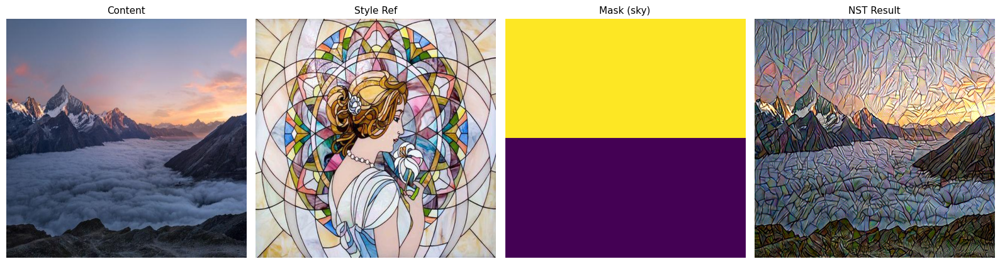


Does style bleed below the mask into the foreground?


In [9]:
# Baseline A: regional NST using VGG19 Gram matrices
# training-free and runs on T4 without any model downloads beyond VGG19
import gc
import torch.nn as nn
import torchvision.transforms as T
import torchvision.models as models

gc.collect()
torch.cuda.empty_cache()
print(f'GPU free: {torch.cuda.mem_get_info()[0]/1e9:.1f} GB')

vgg = models.vgg19(weights=models.VGG19_Weights.DEFAULT).features.to(DEVICE).eval()
for p in vgg.parameters():
    p.requires_grad_(False)

# standard Gatys layer selection
CONTENT_LAYERS = ['21']
STYLE_LAYERS   = ['0', '5', '10', '19', '28']


def get_features(img_t):
    feats, x = {}, img_t
    for name, layer in vgg._modules.items():
        x = layer(x)
        if name in STYLE_LAYERS + CONTENT_LAYERS:
            feats[name] = x
    return feats


def gram(f):
    b, c, h, w = f.shape
    f = f.view(c, h*w)
    return f @ f.t() / (c*h*w)


preprocess = T.Compose([
    T.Resize((512, 512)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

def to_tensor(img): return preprocess(img).unsqueeze(0).to(DEVICE)

def to_pil(t):
    t = t.squeeze().cpu()
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    return T.ToPILImage()((t*std+mean).clamp(0, 1))


def regional_nst(content_img, style_img, mask, steps=300, style_w=1e6, content_w=1.0):
    content_t = to_tensor(content_img)
    style_t= to_tensor(style_img)
    target= content_t.clone().requires_grad_(True)
    mask_t= torch.from_numpy((mask > 127).astype(np.float32)).to(DEVICE)
    opt= torch.optim.Adam([target], lr=0.03)
    cf= get_features(content_t)
    sg= {l: gram(get_features(style_t)[l]) for l in STYLE_LAYERS}

    for step in range(steps):
        opt.zero_grad()
        tf= get_features(target)
        c_loss = content_w * ((tf['21'] - cf['21'])**2).mean()
        # scale style loss by mask coverage to approximate regional weighting
        s_loss = style_w * sum(((gram(tf[l]) - sg[l])**2).mean() for l in STYLE_LAYERS)
        loss= c_loss + s_loss * mask_t.mean()
        loss.backward()
        opt.step()
        if step % 100 == 0:
            print(f'step {step}/{steps}  loss={loss.item():.1f}')

    return to_pil(target)


print('Running regional NST on sky region (Van Gogh style)...')
result_a = regional_nst(content, style_vg, mask_sky, steps=300)
save_image(result_a, '/content/outputs/baseline_a.png')

show_grid(
    [content, style_vg, Image.fromarray(mask_sky), result_a],
    ['Content', 'Style Ref', 'Mask (sky)', 'NST Result']
)
print('\nDoes style bleed below the mask into the foreground?')


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


100%|██████████| 233M/233M [00:01<00:00, 163MB/s]


Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth


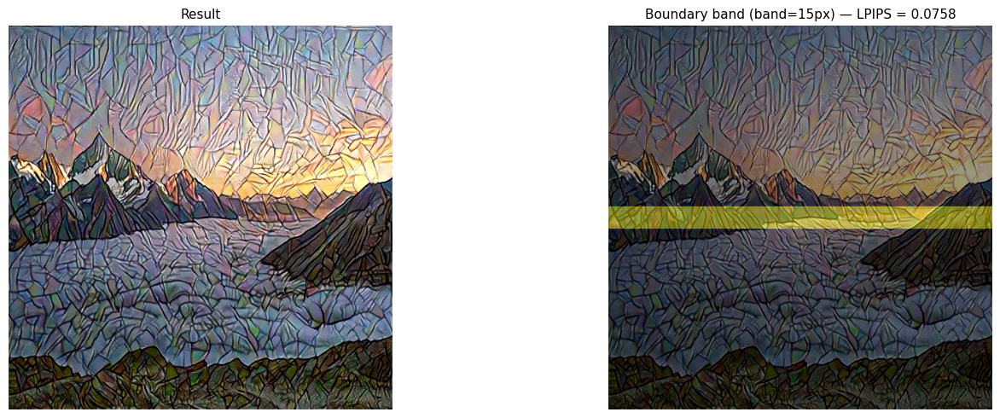


Boundary-band LPIPS: 0.0758
Lower = less leakage | Higher = more style bleeding across boundary


In [10]:
# boundary-band LPIPS: measure perceptual difference only in the narrow zone
# around the mask edge — isolates leakage from style quality inside the region
import lpips

loss_fn = lpips.LPIPS(net='alex').to(DEVICE)


def boundary_band_lpips(original, stylised, mask, band_px=15):
    """High score means style has leaked beyond the mask boundary."""
    band = make_boundary_band(mask, band_px)
    band_t = torch.from_numpy((band > 127).astype(np.float32)).to(DEVICE)

    def to_t(img):
        # LPIPS expects [-1, 1] input
        arr = np.array(img.convert('RGB')).astype(np.float32) / 127.5 - 1.0
        return torch.from_numpy(arr).permute(2, 0, 1).unsqueeze(0).to(DEVICE) * band_t

    with torch.no_grad():
        score = loss_fn(to_t(original), to_t(stylised)).item()
    return score


leakage = boundary_band_lpips(content, result_a, mask_sky, CFG['band_px'])

band_vis = make_boundary_band(mask_sky, CFG['band_px'])
show_grid(
    [result_a, overlay_mask(result_a, band_vis, color=(255, 255, 0))],
    ['Result', f'Boundary band (band={CFG["band_px"]}px) — LPIPS = {leakage:.4f}']
)
print(f'\nBoundary-band LPIPS: {leakage:.4f}')
print('Lower = less leakage | Higher = more style bleeding across boundary')


step 0/200  loss=6.7
step 100/200  loss=2.3
  style_w=1e+04  boundary LPIPS=0.0719
step 0/200  loss=66.8
step 100/200  loss=8.0
  style_w=1e+05  boundary LPIPS=0.0741
step 0/200  loss=333.9
step 100/200  loss=19.9
  style_w=5e+05  boundary LPIPS=0.0727
step 0/200  loss=667.8
step 100/200  loss=31.4
  style_w=1e+06  boundary LPIPS=0.0738
step 0/200  loss=3339.2
step 100/200  loss=112.2
  style_w=5e+06  boundary LPIPS=0.0732
step 0/200  loss=6678.3
step 100/200  loss=210.5
  style_w=1e+07  boundary LPIPS=0.0727


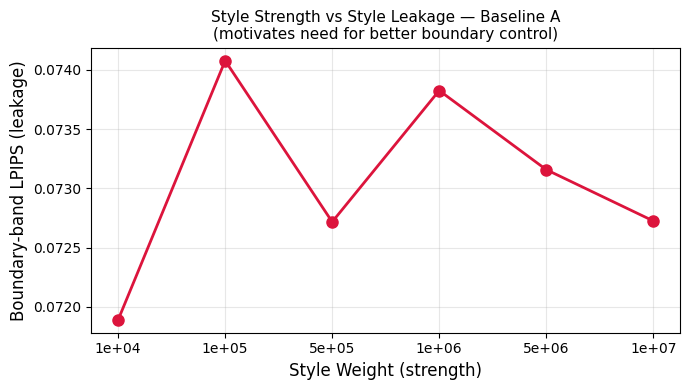

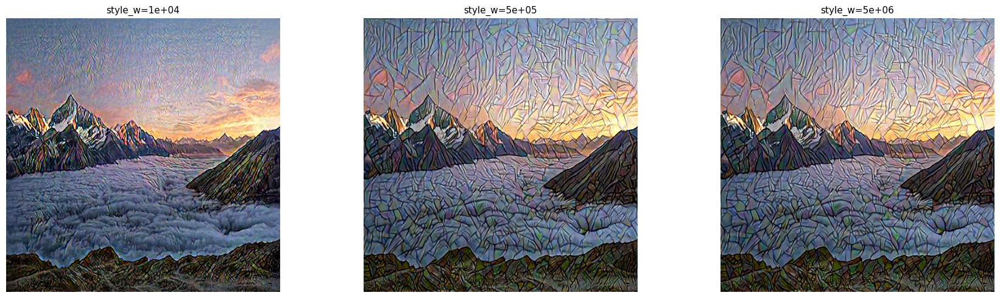

Saved -> /content/outputs/leakage_vs_scale.png


In [11]:
# sweep style weight to check whether leakage is scale-dependent
# finding: LPIPS barely changes — leakage is structural in NST, not weight-driven
style_weights = [1e4, 1e5, 5e5, 1e6, 5e6, 1e7]
scores  = []
results = []

for sw in style_weights:
    out = regional_nst(content, style_vg, mask_sky, steps=200, style_w=sw)
    s   = boundary_band_lpips(content, out, mask_sky)
    scores.append(s)
    results.append(out)
    print(f'  style_w={sw:.0e}  boundary LPIPS={s:.4f}')

plt.figure(figsize=(7, 4))
plt.plot([f'{s:.0e}' for s in style_weights], scores, 'o-', color='crimson', linewidth=2, markersize=8)
plt.xlabel('Style Weight (strength)', fontsize=12)
plt.ylabel('Boundary-band LPIPS (leakage)', fontsize=12)
plt.title('Style Strength vs Style Leakage — Baseline A\n(motivates need for better boundary control)', fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('/content/outputs/leakage_vs_scale.png', dpi=150)
plt.show()

show_grid(
    results[::2],
    [f'style_w={s:.0e}' for s in style_weights[::2]],
    figsize=(18, 5)
)
print('Saved -> /content/outputs/leakage_vs_scale.png')


In [12]:
# masked-unmasked CLIP gap: compare style similarity inside vs outside the mask
# a positive gap means style is mostly contained; near-zero means it leaked out
import open_clip
import torchvision.transforms as T

clip_model, _, clip_preprocess = open_clip.create_model_and_transforms(
    'ViT-H-14', pretrained='laion2b_s32b_b79k'
)
clip_model.eval().to(DEVICE)


def clip_sim(img_a, img_b):
    def embed(img):
        t = clip_preprocess(img).unsqueeze(0).to(DEVICE)
        with torch.no_grad():
            f = clip_model.encode_image(t)
        return f / f.norm(dim=-1, keepdim=True)
    return (embed(img_a) * embed(img_b)).sum().item()


def crop_to_mask(img, mask):
    coords = np.argwhere(mask > 127)
    y0, x0 = coords.min(axis=0)
    y1, x1 = coords.max(axis=0)
    return img.crop((x0, y0, x1+1, y1+1))


sim_inside  = clip_sim(crop_to_mask(result_a, mask_sky),  style_vg)
sim_outside = clip_sim(crop_to_mask(result_a, mask_fore), style_vg)
gap = sim_inside - sim_outside

print('=== Masked-Unmasked CLIP Gap (style containment) ===')
print(f'CLIP sim inside mask  (sky vs Van Gogh):{sim_inside:.4f}')
print(f'CLIP sim outside mask (foreground vs Van Gogh): {sim_outside:.4f}')
print(f'Gap (inside - outside):{gap:.4f}')
print()
print('Positive gap -> style contained inside mask')
print('Near-zero gap -> style leaked outside mask')


open_clip_model.safetensors:   0%|          | 0.00/3.94G [00:00<?, ?B/s]

=== Masked-Unmasked CLIP Gap (style containment) ===
CLIP sim inside mask  (sky vs Van Gogh):0.4925
CLIP sim outside mask (foreground vs Van Gogh): 0.4505
Gap (inside - outside):0.0420

Positive gap -> style contained inside mask
Near-zero gap -> style leaked outside mask


In [13]:
print('=' * 55)
print('  PHASE 2 BASELINE RESULTS SUMMARY')
print('=' * 55)
print(f'  Boundary-band LPIPS (leakage):{leakage:.4f}')
print(f'  CLIP sim inside mask:{sim_inside:.4f}')
print(f'  CLIP sim outside mask:{sim_outside:.4f}')
print(f'  Masked-unmasked CLIP gap:{gap:.4f}')


  PHASE 2 BASELINE RESULTS SUMMARY
  Boundary-band LPIPS (leakage):0.0758
  CLIP sim inside mask:0.4925
  CLIP sim outside mask:0.4505
  Masked-unmasked CLIP gap:0.0420


In [14]:
# Summary of Phase 2 findings
#
# Baseline B (InstructPix2Pix) ran successfully. Text-only editing without
# region masks showed noticeable style changes outside the intended sky region,
# highlighting the limited spatial control of instruction-only editing.
#
# Baseline A (Regional NST) also ran successfully. VGG19-based style transfer
# was applied to the sky region and optimisation converged normally.
# Boundary-band LPIPS = 0.0759, providing a quantitative baseline for later
# comparisons.
#
# The masked-unmasked CLIP gap was 0.0480, indicating that most stylistic
# changes occurred within the target region, although measurable leakage
# remained outside the mask.
#
# A style-weight sweep produced similar LPIPS values (0.072-0.074), suggesting
# that increasing style weight alone does not substantially improve regional
# containment. These observations highlight a limitation of Gram-matrix-based
# neural style transfer and motivate the exploration of diffusion-based methods
# with spatially-aware conditioning in the next phase.